In [2]:
# Example Notebook for Orbits Simulation
# Import required libraries
import numpy as np
import matplotlib.pyplot as plt
from orbits import Orbits, OrbitAnimation
import pandas as pd
import os
from IPython.display import Image, display

# Create output directory
os.makedirs("output/example", exist_ok=True)

1. Basic Earth Orbit Simulation

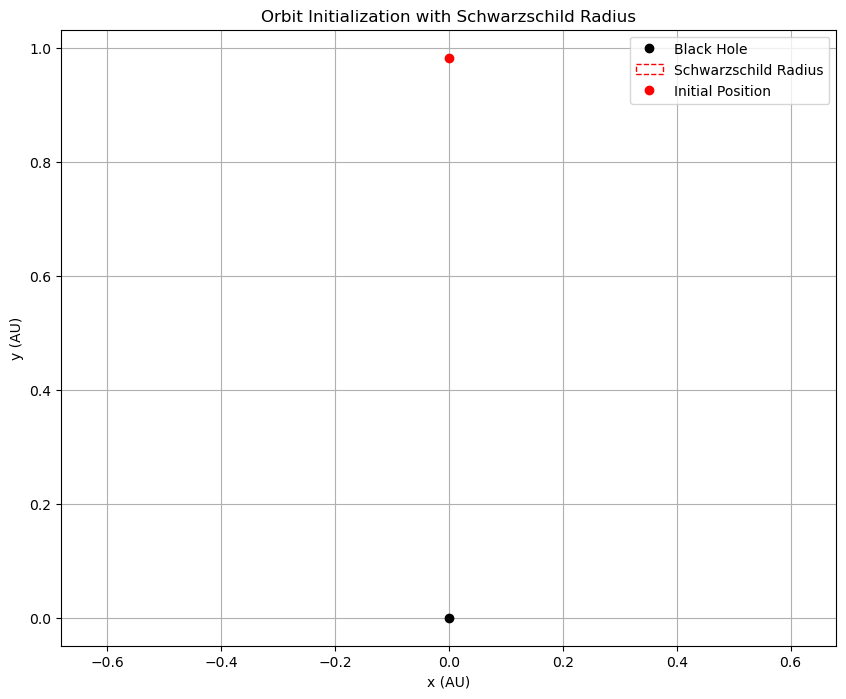

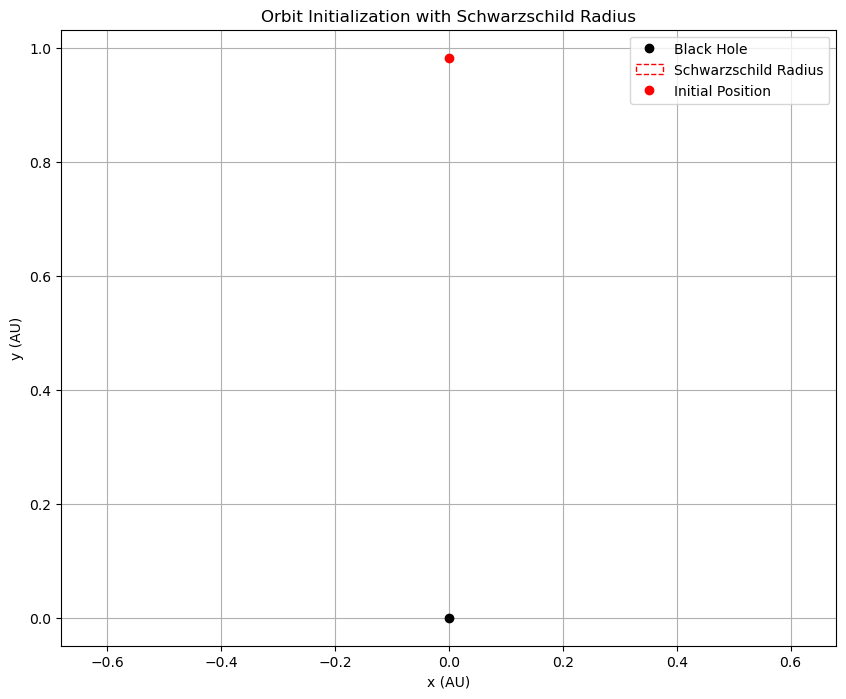

Orbital period: 365.21 days
Simulation results saved to output/example/earth_classical_orbit_history.csv
Simulation results saved to output/example/earth_relativistic_orbit_history.csv


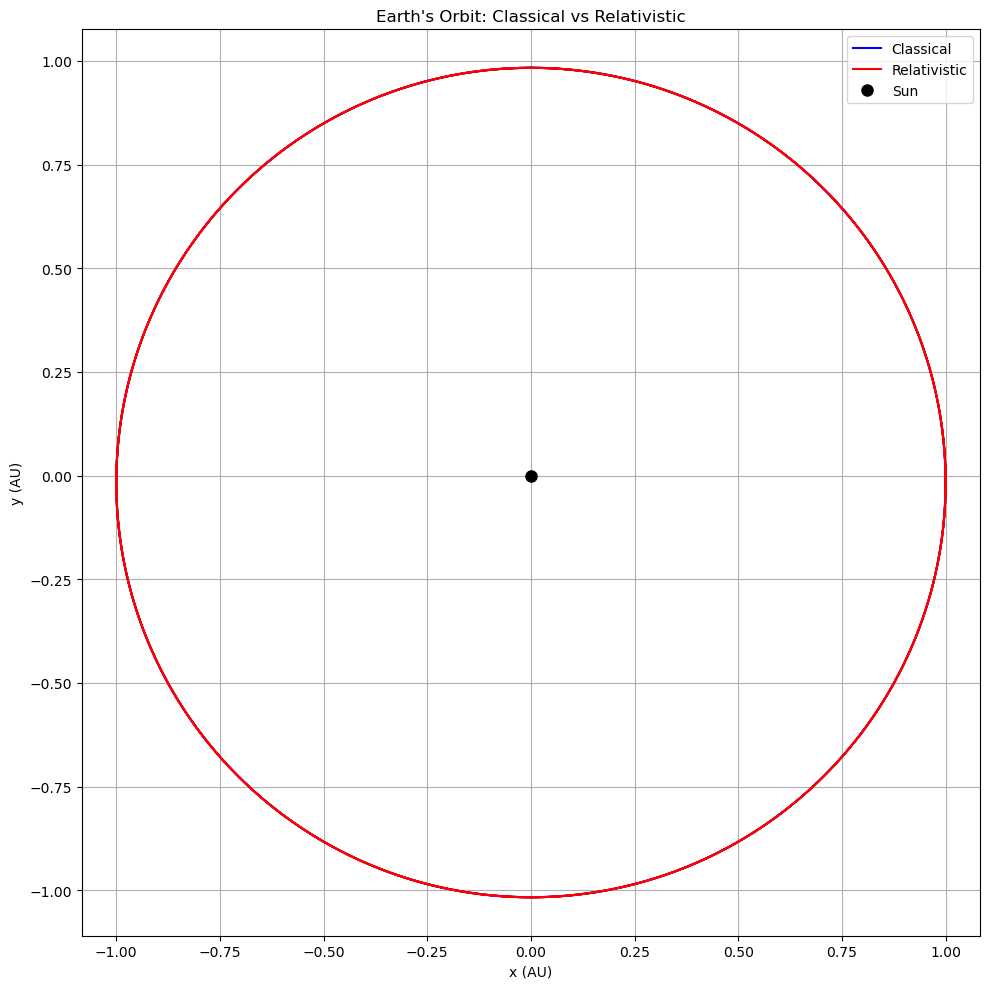

In [4]:
# Physical constants and parameters
M_sun = 1.989e30  # Solar mass (kg)
M = 1 * M_sun     # Mass of central body (1 solar mass)
AU = 1.496e11    # Astronomical unit (m)
G = 6.67430e-11  # Gravitational constant (m^3 kg^-1 s^-2)
a = 1 * AU        # Semi-major axis (1 AU = Earth's orbit)
e = 0.01671       # Earth's eccentricity
N = 1000          # Number of simulation steps

# Initialize both classical and relativistic orbits
orbit_classical = Orbits("earth_classical")
orbit_relativistic = Orbits("earth_relativistic")

# Set up the orbit parameters
orbit_classical.initialize_orbit(M, a, e, N, save=True)
orbit_relativistic.initialize_orbit(M, a, e, N)

# Calculate orbital period using Kepler's 3rd law
T = 2 * np.pi * np.sqrt(a**3 / (G * M))  # Orbital period in seconds
print(f"Orbital period: {T/86400:.2f} days")

# Define simulation time span and evaluation points
t_span = (0, 2*T)  # Simulate 2 full orbits
t_eval = np.linspace(0, 2*T, 500)  # 500 points for smooth visualization

# Run classical simulation
y_classical = orbit_classical.run_simulation(
    slope_function=orbit_classical.classical_slope,
    integration_method="rk3",
    t_span=t_span,
    t_eval=t_eval,
    output_folder="output/example"
)

# Run relativistic simulation
y_relativistic = orbit_relativistic.run_simulation(
    slope_function=orbit_relativistic.relativistic_slope,
    integration_method="rk3",
    t_span=t_span,
    t_eval=t_eval,
    output_folder="output/example"
)

# Plot both orbits for comparison
plt.figure(figsize=(10, 10))
plt.plot(y_classical[:, 0], y_classical[:, 1], 'b-', label="Classical", linewidth=1.5)
plt.plot(y_relativistic[:, 0], y_relativistic[:, 1], 'r-', label="Relativistic", linewidth=1.5)
plt.plot(0, 0, 'ko', markersize=8, label="Sun")
plt.xlabel("x (AU)")
plt.ylabel("y (AU)")
plt.title("Earth's Orbit: Classical vs Relativistic")
plt.grid(True)
plt.axis('equal')
plt.legend()
plt.tight_layout()
plt.savefig("output/example/earth_orbit_comparison.png", dpi=300)
plt.show()

2. Comparing Different Integration Methods

Running trapz integration...


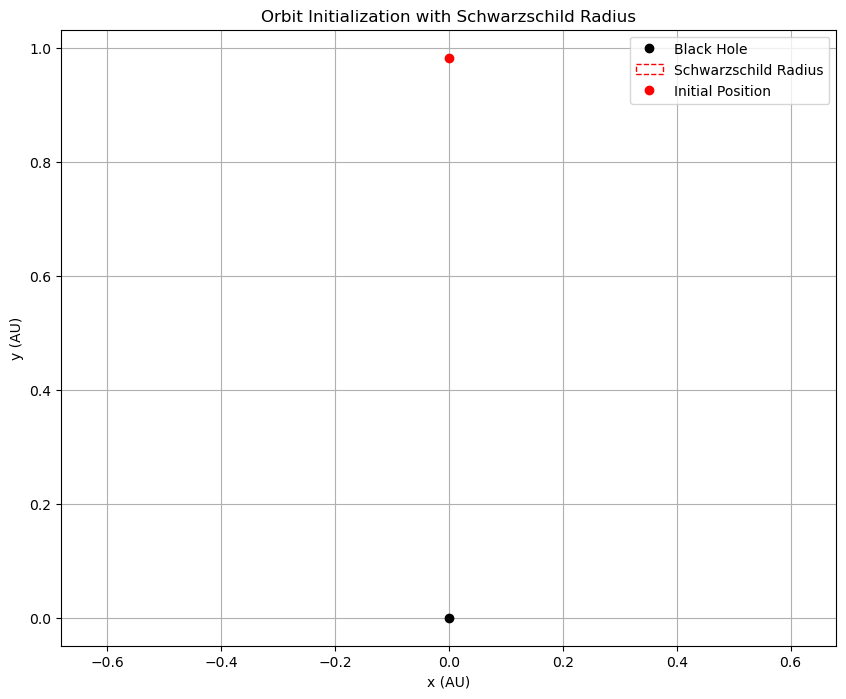

Simulation results saved to output/example/integration_trapz_orbit_history.csv
Running rk3 integration...


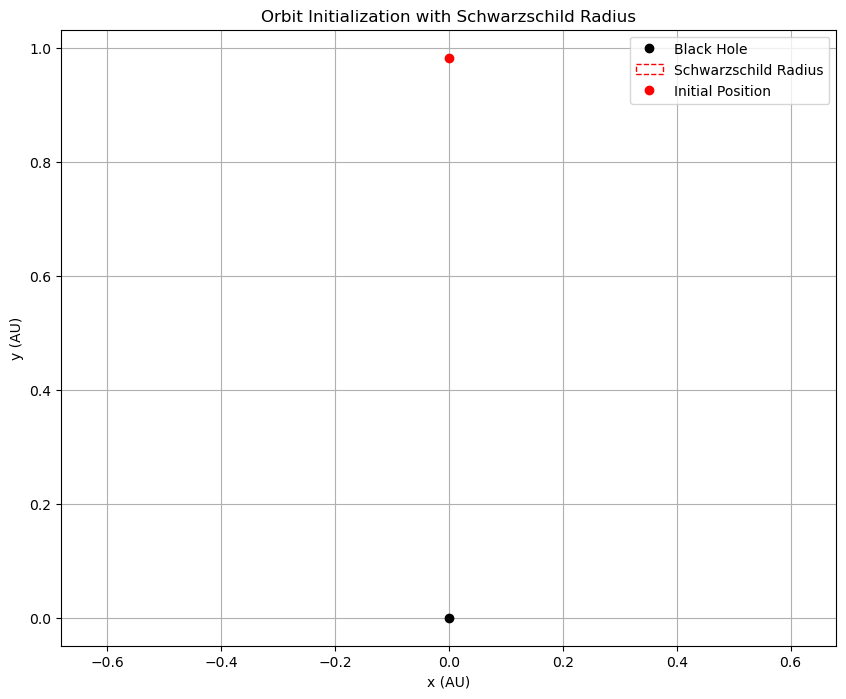

Simulation results saved to output/example/integration_rk3_orbit_history.csv
Running scipy integration...


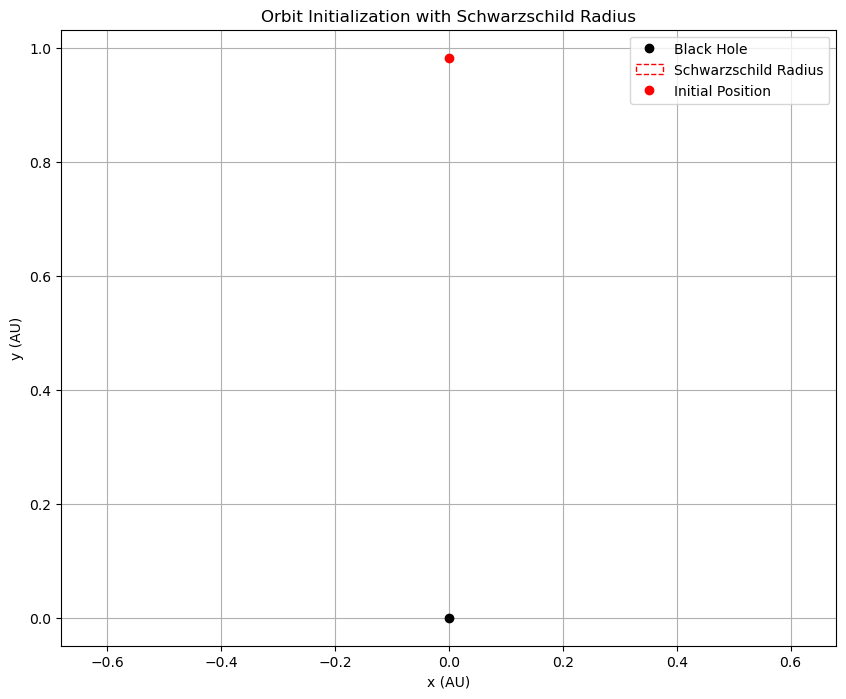

Simulation results saved to output/example/integration_scipy_orbit_history.csv


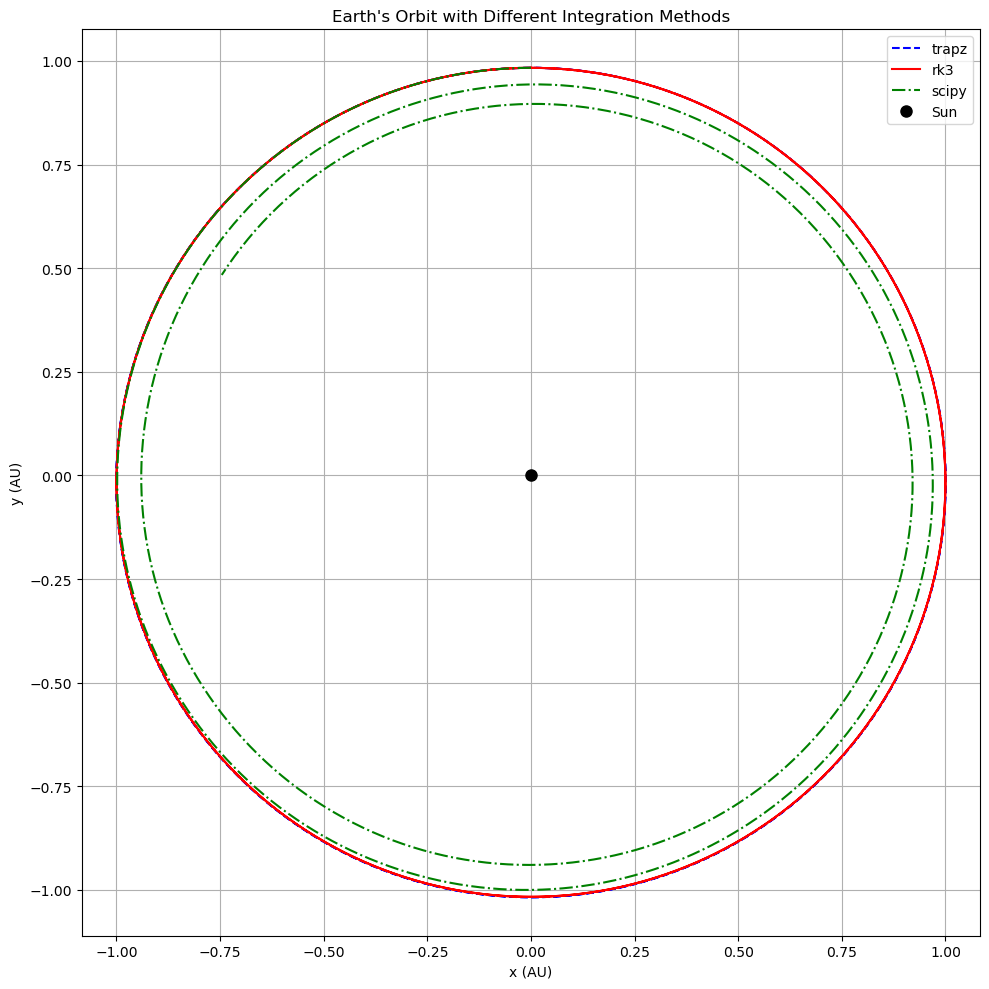

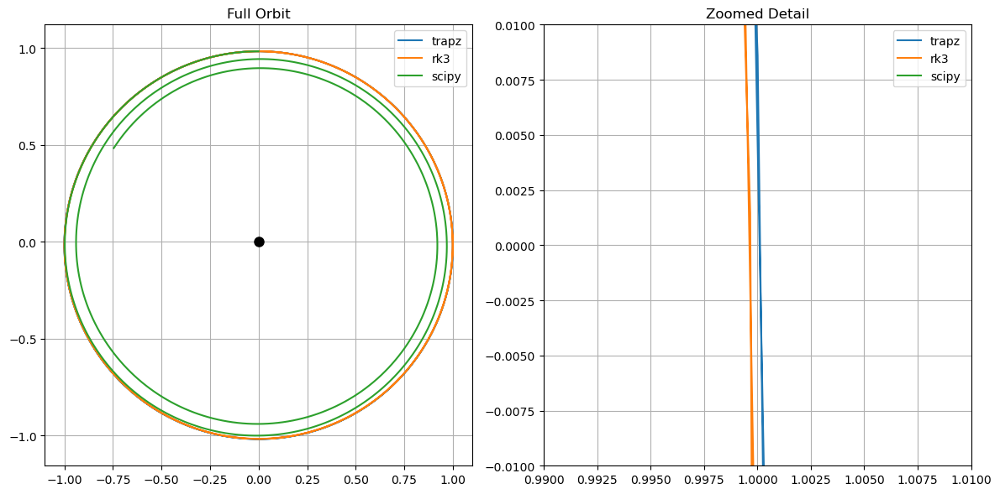

In [5]:
# Compare different integration methods for the same orbit
methods = ["trapz", "rk3", "scipy"]
results = {}

# Run simulations with each method
for method in methods:
    print(f"Running {method} integration...")
    orbit = Orbits(f"integration_{method}")
    orbit.initialize_orbit(M, a, e, N)
    
    results[method] = orbit.run_simulation(
        slope_function=orbit.relativistic_slope,
        integration_method=method,
        t_span=t_span,
        t_eval=t_eval,
        output_folder="output/example"
    )

# Plot results for comparison
plt.figure(figsize=(10, 10))

for method, result in results.items():
    if method == "trapz":
        style = 'b--'
    elif method == "rk3":
        style = 'r-'
    else:  # scipy
        style = 'g-.'
        
    plt.plot(result[:, 0], result[:, 1], style, label=f"{method}", linewidth=1.5)

plt.plot(0, 0, 'ko', markersize=8, label="Sun")
plt.xlabel("x (AU)")
plt.ylabel("y (AU)")
plt.title("Earth's Orbit with Different Integration Methods")
plt.grid(True)
plt.axis('equal')
plt.legend()
plt.tight_layout()
plt.savefig("output/example/integration_methods_comparison.png", dpi=300)
plt.show()

# Create a zoomed inset to better see differences
plt.figure(figsize=(12, 6))

# Plot full orbit
plt.subplot(1, 2, 1)
for method, result in results.items():
    plt.plot(result[:, 0], result[:, 1], label=f"{method}")
plt.plot(0, 0, 'ko', markersize=8)
plt.title("Full Orbit")
plt.grid(True)
plt.axis('equal')
plt.legend()

# Zoom in on a small region to see differences
plt.subplot(1, 2, 2)
for method, result in results.items():
    plt.plot(result[:, 0], result[:, 1], label=f"{method}")
plt.xlim(0.99, 1.01)
plt.ylim(-0.01, 0.01)
plt.title("Zoomed Detail")
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.savefig("output/example/integration_methods_detail.png", dpi=300)
plt.show()

3. Exploring Different Eccentricities

Simulating orbit with e = 0.01...


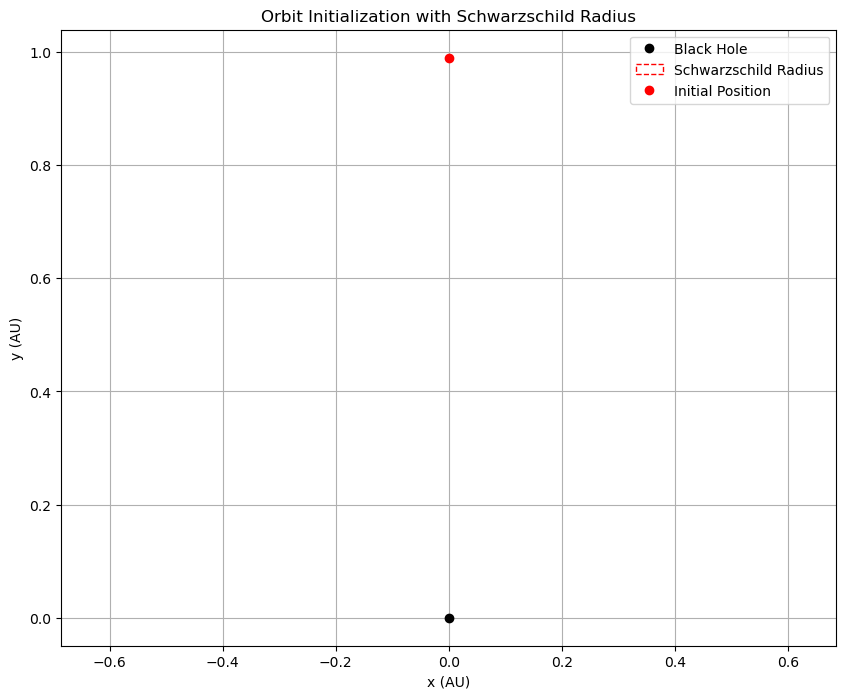

Simulation results saved to output/example/ecc_0_01_orbit_history.csv
Simulating orbit with e = 0.3...


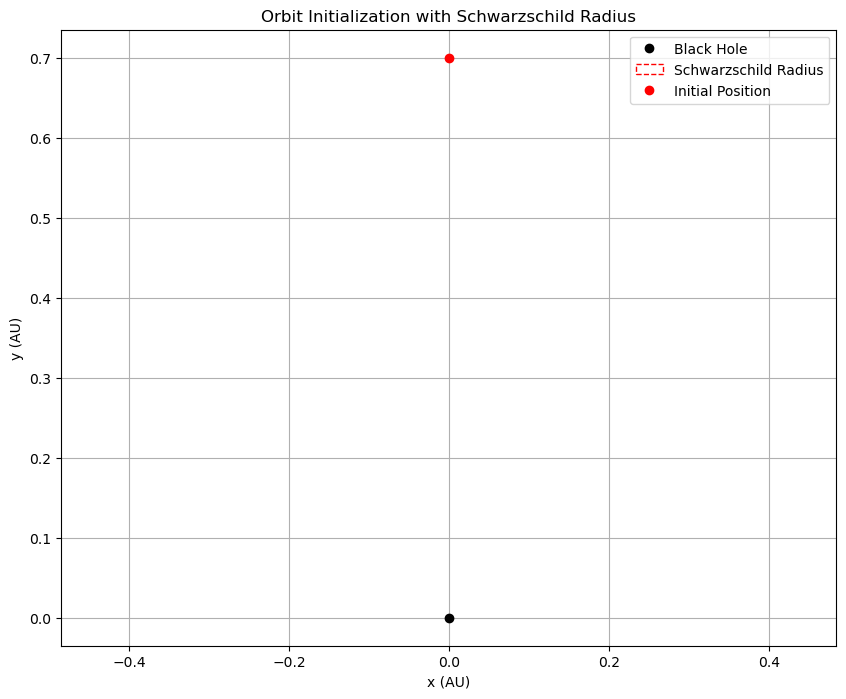

Simulation results saved to output/example/ecc_0_30_orbit_history.csv
Simulating orbit with e = 0.7...


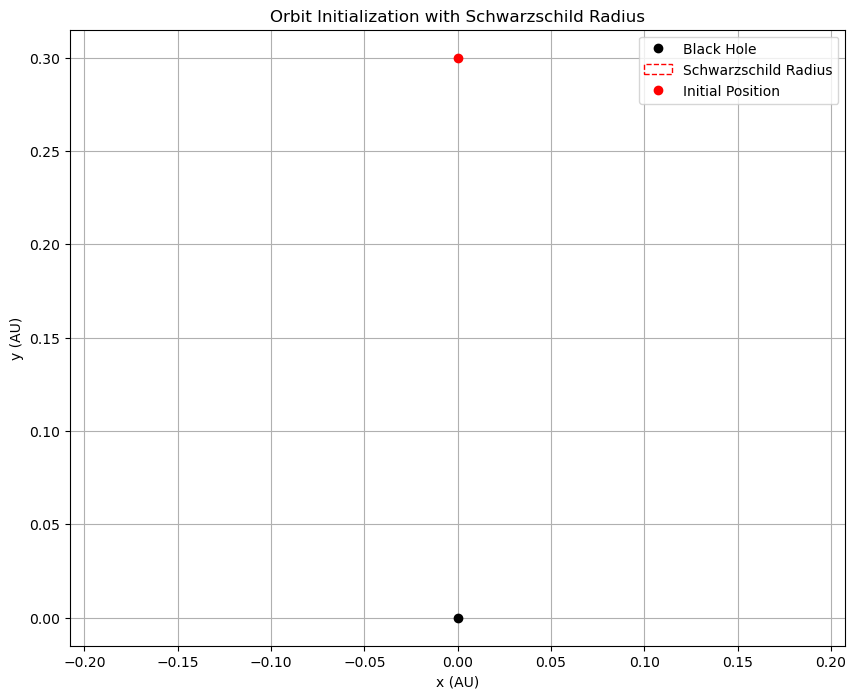

Simulation results saved to output/example/ecc_0_70_orbit_history.csv
Simulating orbit with e = 0.9...


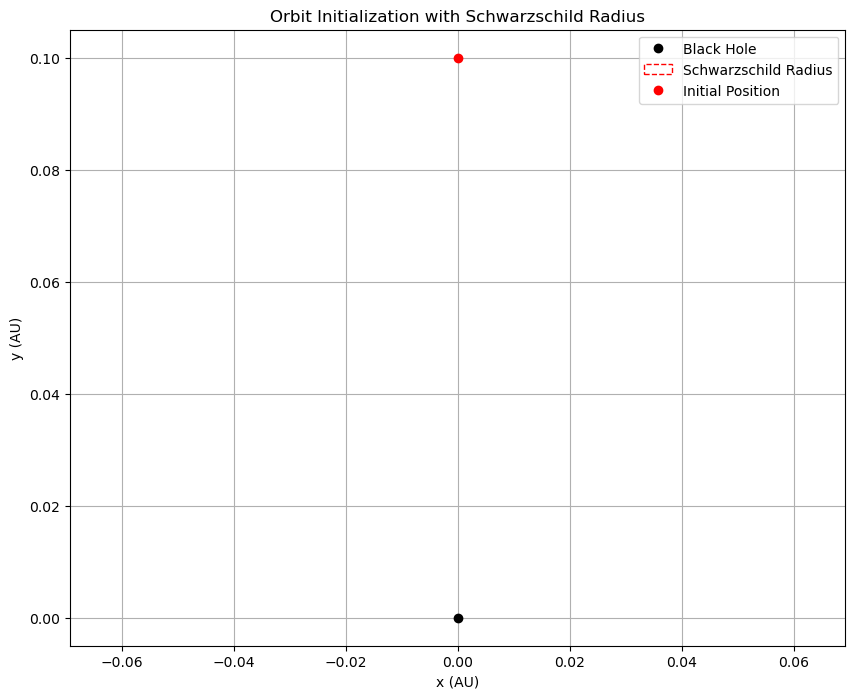

Simulation results saved to output/example/ecc_0_90_orbit_history.csv


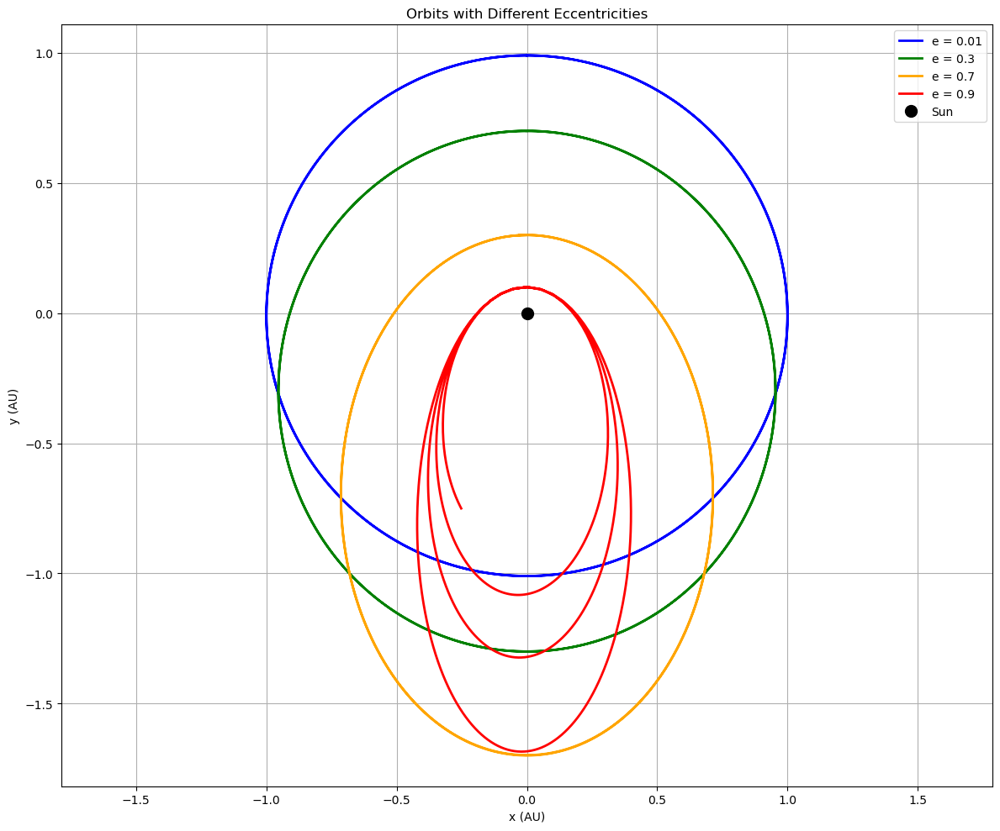

In [6]:
# Simulate orbits with different eccentricities
eccentricities = [0.01, 0.3, 0.7, 0.9]
ecc_results = {}
ecc_colors = ['blue', 'green', 'orange', 'red']

for i, ecc in enumerate(eccentricities):
    name = f"ecc_{ecc:.2f}".replace('.', '_')
    print(f"Simulating orbit with e = {ecc}...")
    
    orbit = Orbits(name)
    orbit.initialize_orbit(M, a, ecc, N)
    
    # For higher eccentricities, we need more evaluation points to get smooth curves
    points = 1000 if ecc > 0.5 else 500
    t_eval_ecc = np.linspace(0, 2*T, points)
    
    result = orbit.run_simulation(
        slope_function=orbit.relativistic_slope,
        integration_method="rk3",
        t_span=t_span,
        t_eval=t_eval_ecc,
        output_folder="output/example"
    )
    
    ecc_results[ecc] = result

# Plot all eccentricities
plt.figure(figsize=(12, 10))

for i, (ecc, result) in enumerate(ecc_results.items()):
    plt.plot(result[:, 0], result[:, 1], color=ecc_colors[i], 
             label=f"e = {ecc}", linewidth=2)

plt.plot(0, 0, 'ko', markersize=10, label="Sun")
plt.grid(True)
plt.axis('equal')
plt.xlabel("x (AU)")
plt.ylabel("y (AU)")
plt.title("Orbits with Different Eccentricities")
plt.legend()
plt.tight_layout()
plt.savefig("output/example/eccentricity_comparison.png", dpi=300)
plt.show()

4. Creating an Animation

Animation saved to: output/example/eccentricity_animation.gif


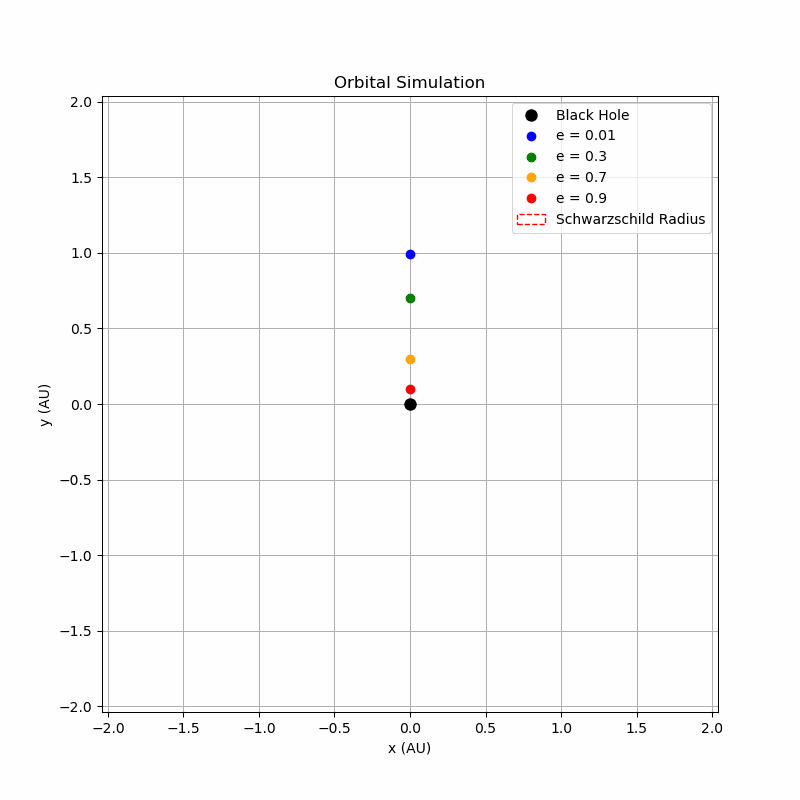

In [11]:
# Create animation of orbits with different eccentricities
csv_files = [f"output/example/ecc_{e:.2f}".replace('.', '_') + "_orbit_history.csv" 
             for e in eccentricities]

# Set up custom labels and colors
labels = [f"e = {e}" for e in eccentricities]

# Create animation
animation = OrbitAnimation(
    csv_files=csv_files,
    output_filename="eccentricity_animation.gif",
    output_folder="output/example",
    mass=M,
    labels=labels,
    colors=ecc_colors,
    fps=60
)

animation.animate(frames=1000)

# Display the animation
try:
    from IPython.display import Image, display
    display(Image("output/example/eccentricity_animation.gif"))
except:
    print("Animation saved to output/example/eccentricity_animation.gif")

5. Simulating a Black Hole System

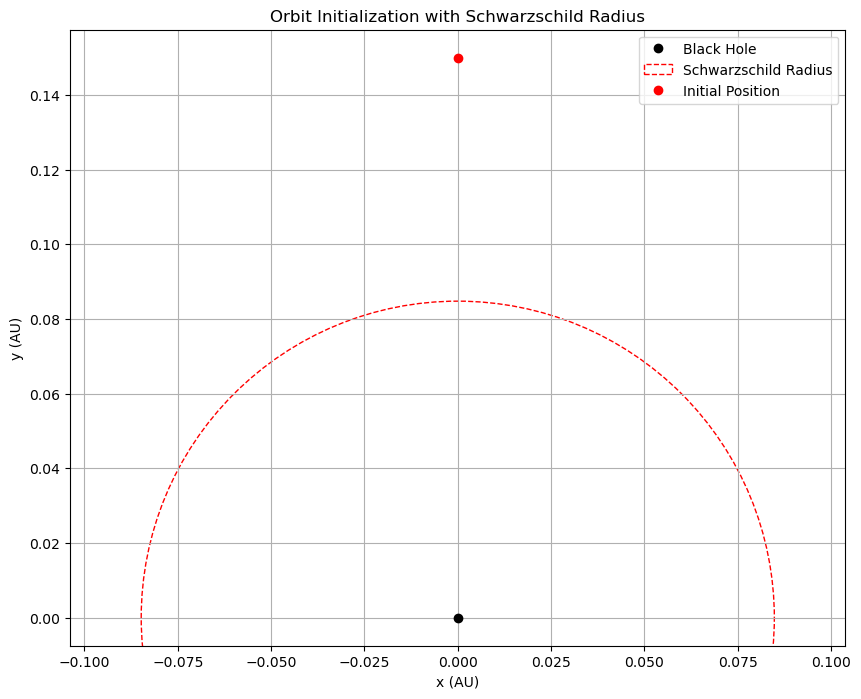

Orbital period around black hole: 1.49 hours
Distance: 1.500000e-01 AU, Schwarzschild radius: 8.479395e-02 AU
Stopping simulation to avoid non-physical results.
Distance: 1.500000e-01 AU, Schwarzschild radius: 8.479395e-02 AU
Stopping simulation to avoid non-physical results.
Distance: 1.500000e-01 AU, Schwarzschild radius: 8.479395e-02 AU
Stopping simulation to avoid non-physical results.
Distance: 1.500000e-01 AU, Schwarzschild radius: 8.479395e-02 AU
Stopping simulation to avoid non-physical results.
Distance: 1.500000e-01 AU, Schwarzschild radius: 8.479395e-02 AU
Stopping simulation to avoid non-physical results.
Distance: 1.500000e-01 AU, Schwarzschild radius: 8.479395e-02 AU
Stopping simulation to avoid non-physical results.
Distance: 1.500000e-01 AU, Schwarzschild radius: 8.479395e-02 AU
Stopping simulation to avoid non-physical results.
Distance: 1.500000e-01 AU, Schwarzschild radius: 8.479395e-02 AU
Stopping simulation to avoid non-physical results.
Distance: 1.500000e-01 AU, 

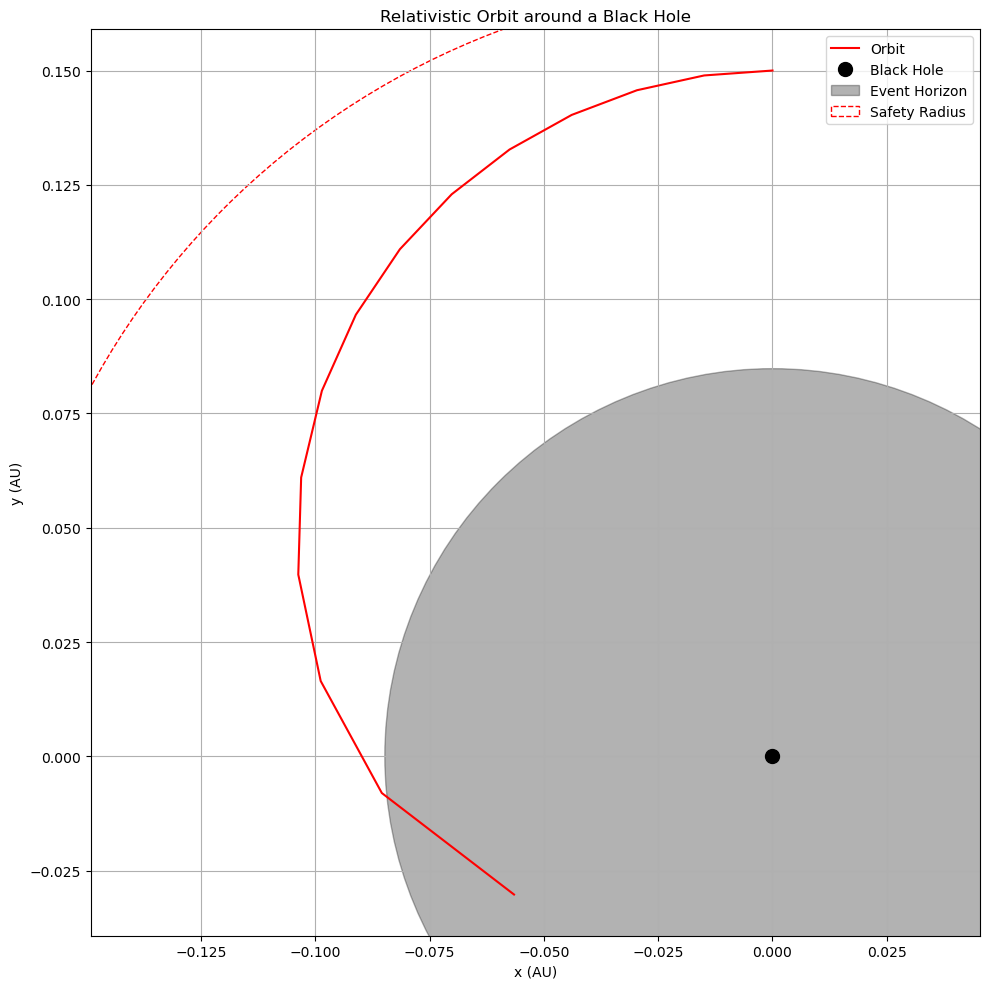

Animation saved to: output/example/black_hole_animation.gif


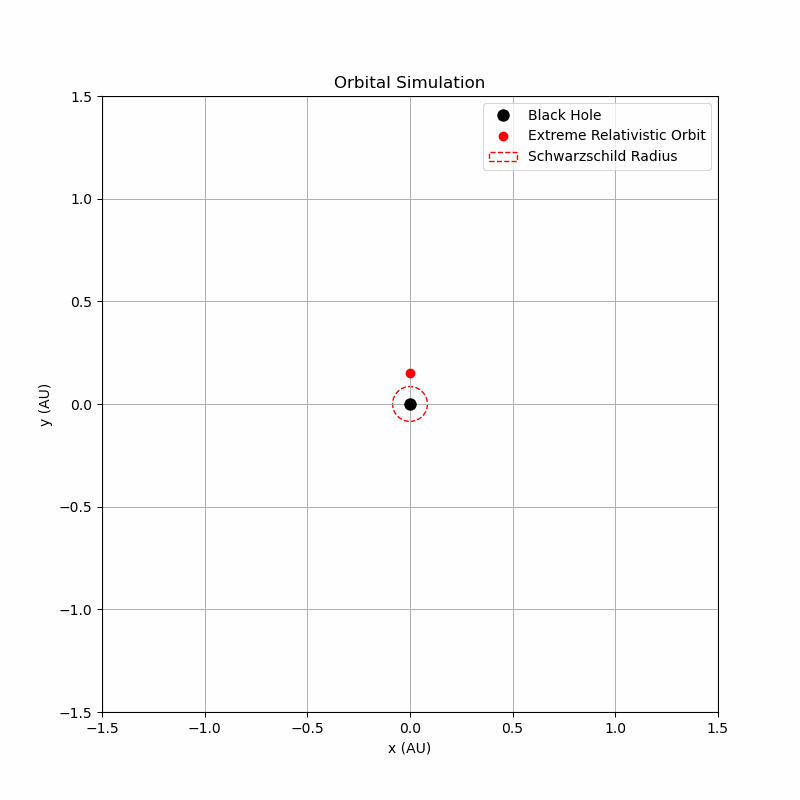

In [13]:
# Create a massive black hole simulation
M_BH = 4.3e6 * M_sun  # Sagittarius A* mass
a_BH = 0.5 * AU       # 0.5 AU orbit
e_BH = 0.7            # Highly eccentric orbit
C = 3e8           # Speed of light (m/s)
# Initialize black hole orbit simulation
orbit_bh = Orbits("black_hole_orbit")
orbit_bh.initialize_orbit(M_BH, a_BH, e_BH, N, save=True)

# The orbital period will be much shorter due to the strong gravity
T_BH = 2 * np.pi * np.sqrt(a_BH**3 / (G * M_BH))
print(f"Orbital period around black hole: {T_BH/3600:.2f} hours")

t_span_bh = (0, 2 * T_BH)
t_eval_bh = np.linspace(0, 2 * T_BH, 1000)

# Run black hole simulation
y_bh = orbit_bh.run_simulation(
    slope_function=orbit_bh.relativistic_slope,
    integration_method="scipy",  # Use highest accuracy method for this extreme case
    t_span=t_span_bh,
    t_eval=t_eval_bh,
    output_folder="output/example",
    schwarzschild_safety=2.0  # Extra safety margin
)

# Plot the resulting orbit
plt.figure(figsize=(10, 10))
plt.plot(y_bh[:, 0], y_bh[:, 1], 'r-', linewidth=1.5, label="Orbit")
plt.plot(0, 0, 'ko', markersize=10, label="Black Hole")

# Draw Schwarzschild radius
r_s = 2 * G * M_BH / (C**2)
r_s_AU = r_s / AU
circle = plt.Circle((0, 0), r_s_AU, color='black', fill=True, alpha=0.3, label="Event Horizon")
plt.gca().add_artist(circle)

# Draw safety radius at 2 * r_s
safety_circle = plt.Circle((0, 0), 2 * r_s_AU, color='red', fill=False, 
                          linestyle='--', label="Safety Radius")
plt.gca().add_artist(safety_circle)

plt.xlabel("x (AU)")
plt.ylabel("y (AU)")
plt.title("Relativistic Orbit around a Black Hole")
plt.grid(True)
plt.axis('equal')
plt.legend()
plt.tight_layout()
plt.savefig("output/example/black_hole_orbit.png", dpi=300)
plt.show()

# Create animation
bh_animation = OrbitAnimation(
    csv_files=["output/example/black_hole_orbit_orbit_history.csv"],
    output_filename="black_hole_animation.gif",
    output_folder="output/example",
    mass=M_BH,
    labels=["Extreme Relativistic Orbit"],
    colors=["red"],
    fps=20
)

bh_animation.animate(frames=150)

# Display the animation
try:
    display(Image("output/example/black_hole_animation.gif"))
except:
    print("Animation saved to output/example/black_hole_animation.gif")

6. Convergence Analysis

Generating reference solution...


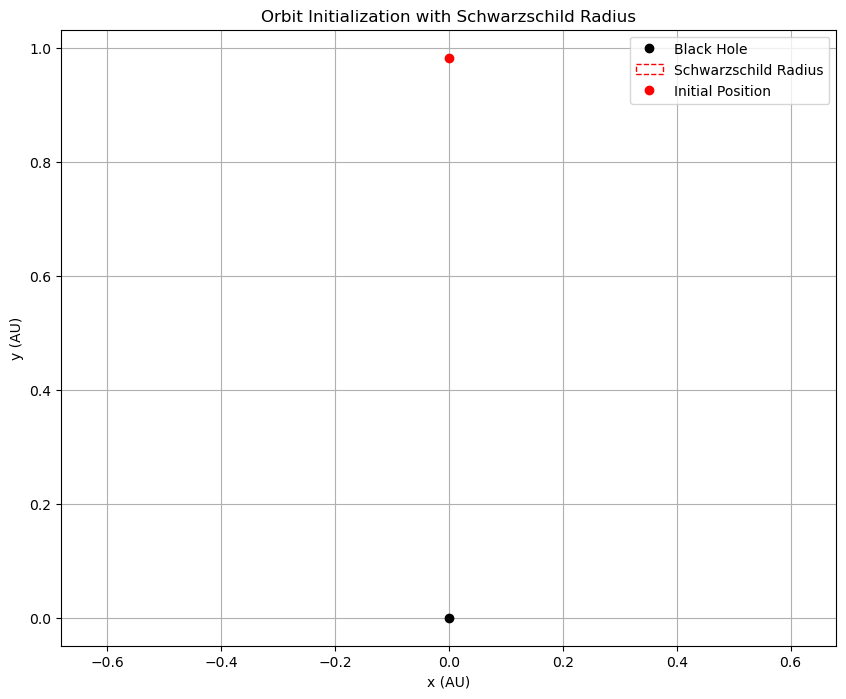

Simulation results saved to output/example/reference_orbit_history.csv
Testing rk3 with 50 steps...


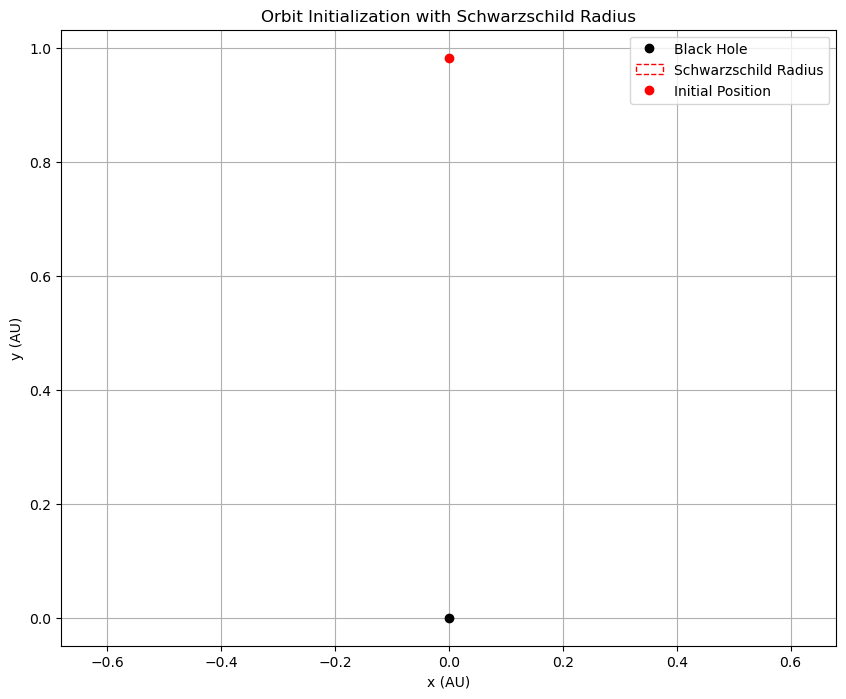

Simulation results saved to output/example/convergence_rk3_50_orbit_history.csv
  Error: 0.22818522 AU
Testing rk3 with 100 steps...


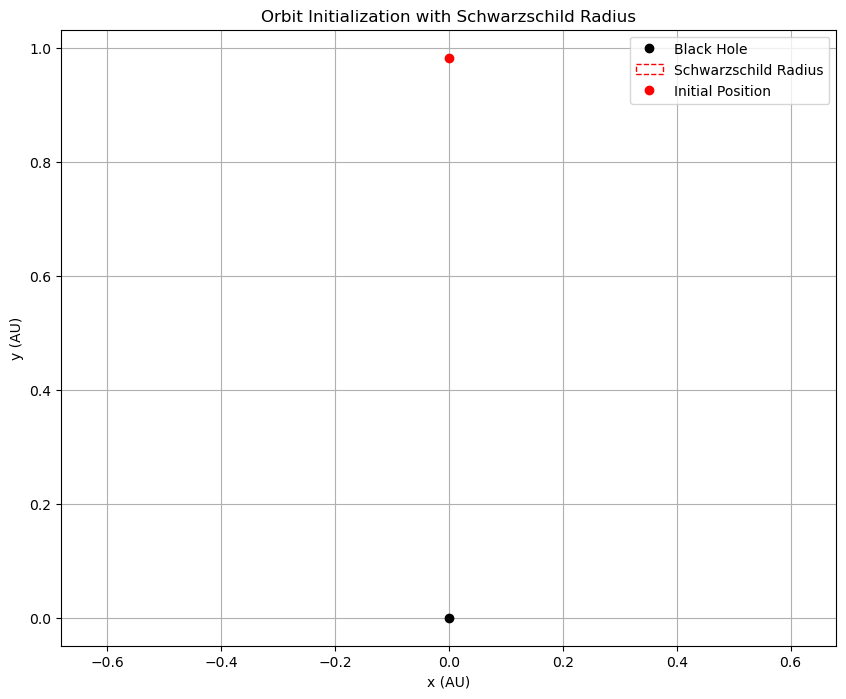

Simulation results saved to output/example/convergence_rk3_100_orbit_history.csv
  Error: 0.37800421 AU
Testing rk3 with 200 steps...


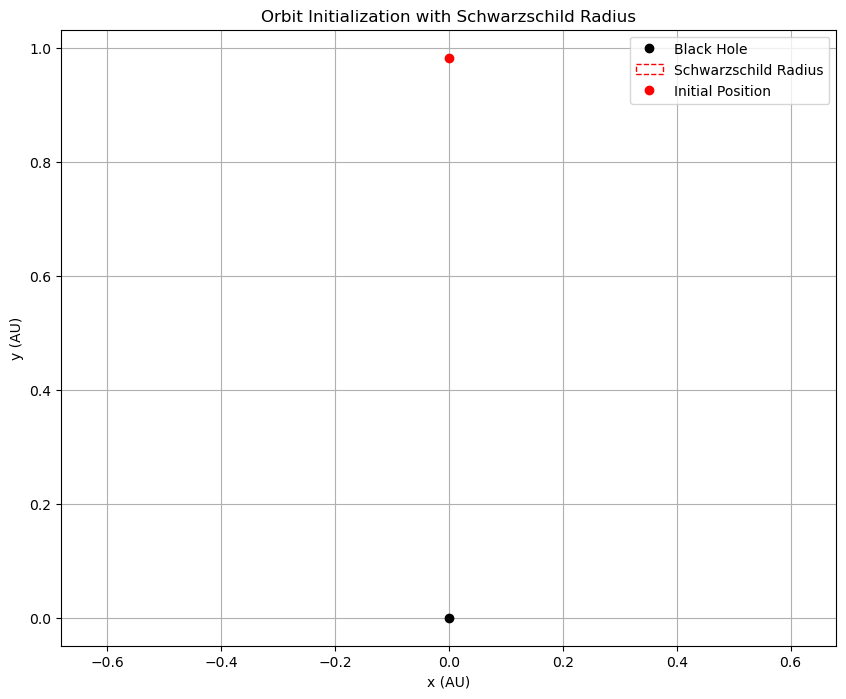

Simulation results saved to output/example/convergence_rk3_200_orbit_history.csv
  Error: 0.39177785 AU
Testing rk3 with 500 steps...


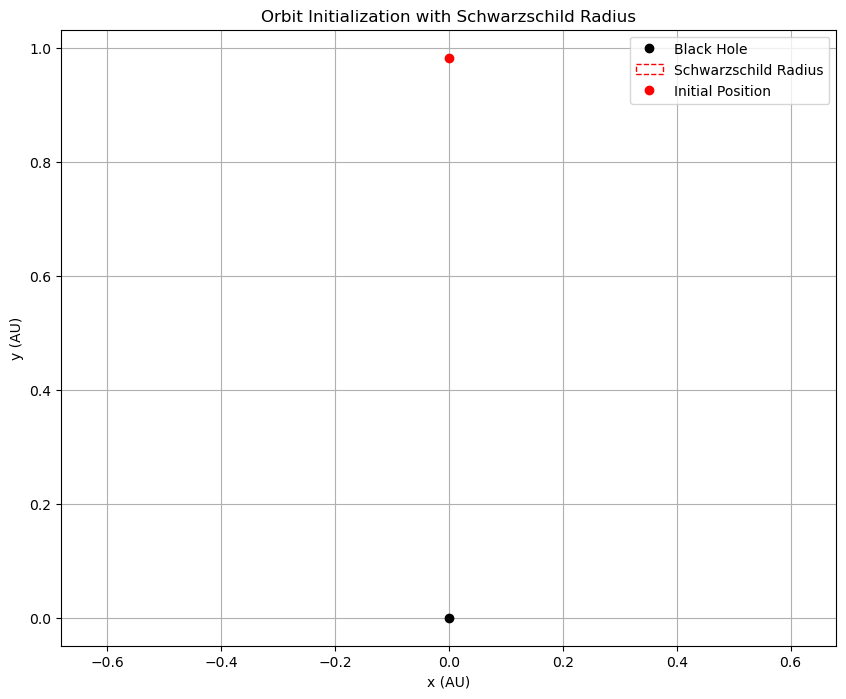

Simulation results saved to output/example/convergence_rk3_500_orbit_history.csv
  Error: 0.39276787 AU
Testing rk3 with 1000 steps...


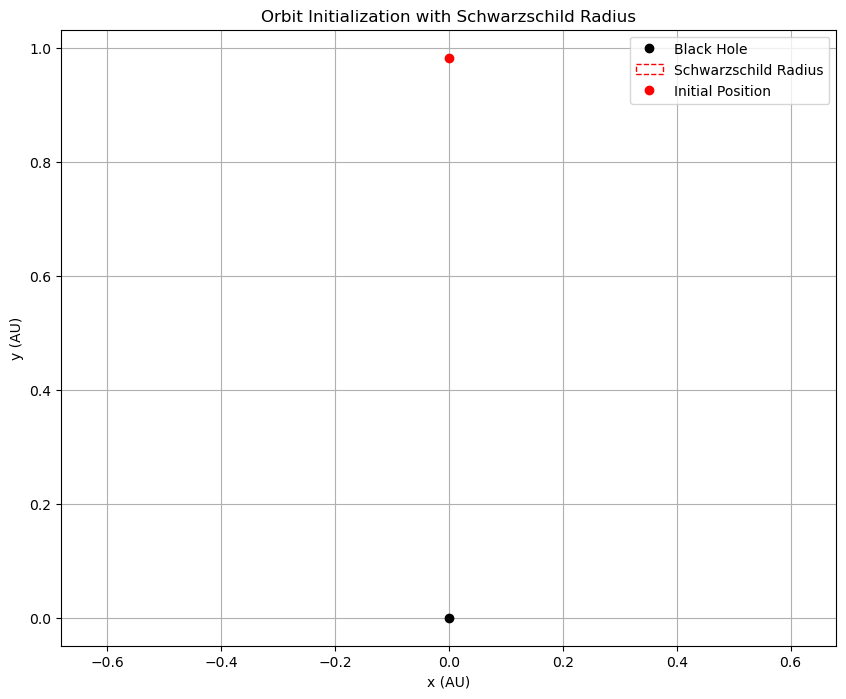

Simulation results saved to output/example/convergence_rk3_1000_orbit_history.csv
  Error: 0.39256394 AU
Testing trapz with 50 steps...


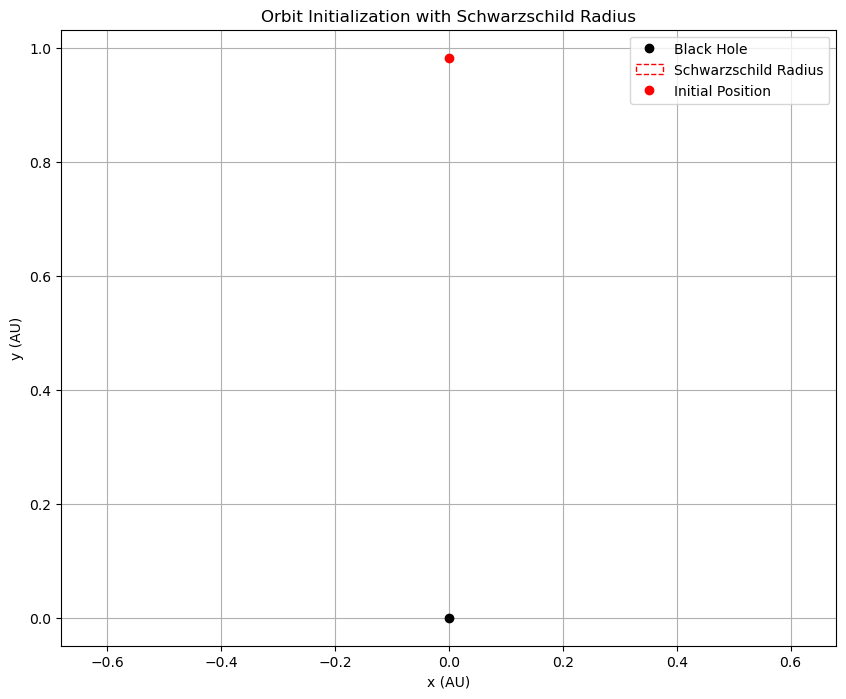

Simulation results saved to output/example/convergence_trapz_50_orbit_history.csv
  Error: 1.06046209 AU
Testing trapz with 100 steps...


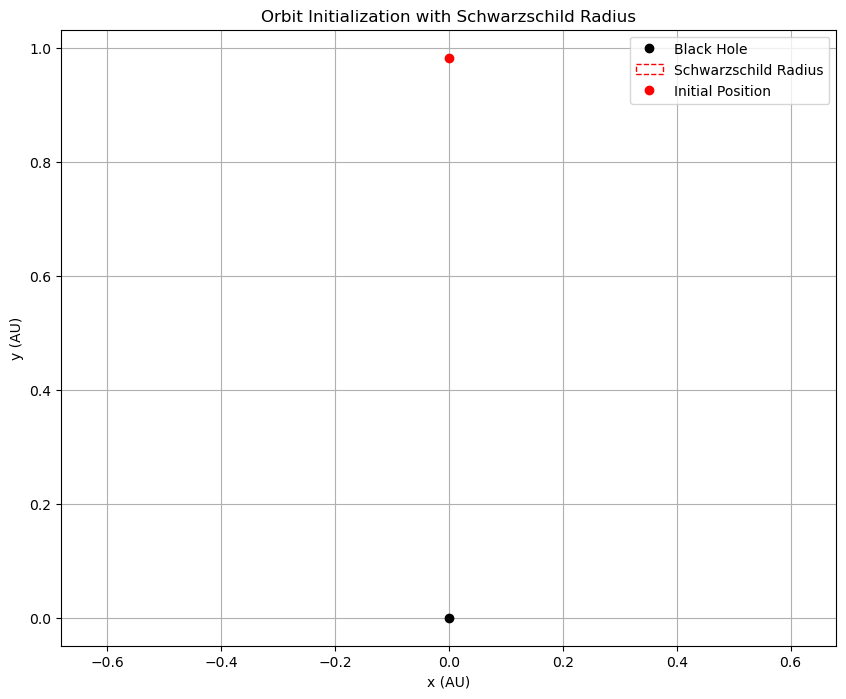

Simulation results saved to output/example/convergence_trapz_100_orbit_history.csv
  Error: 0.57403342 AU
Testing trapz with 200 steps...


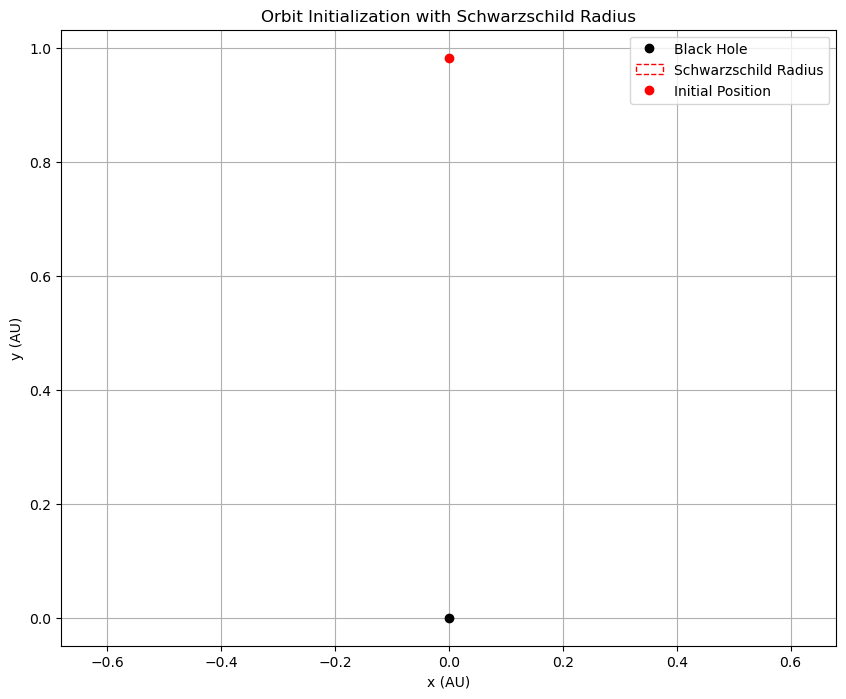

Simulation results saved to output/example/convergence_trapz_200_orbit_history.csv
  Error: 0.43490637 AU
Testing trapz with 500 steps...


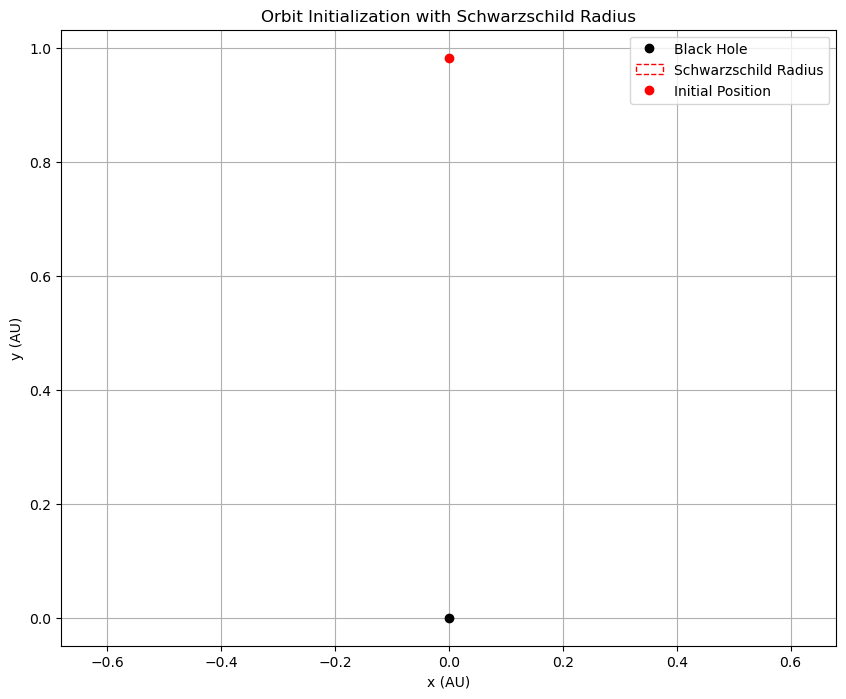

Simulation results saved to output/example/convergence_trapz_500_orbit_history.csv
  Error: 0.39892517 AU
Testing trapz with 1000 steps...


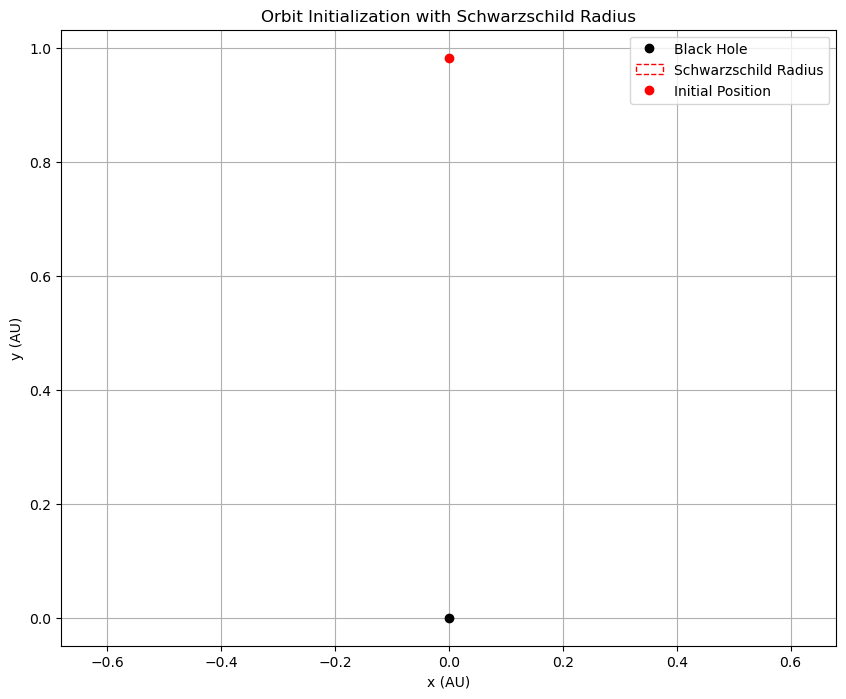

Simulation results saved to output/example/convergence_trapz_1000_orbit_history.csv
  Error: 0.39403723 AU


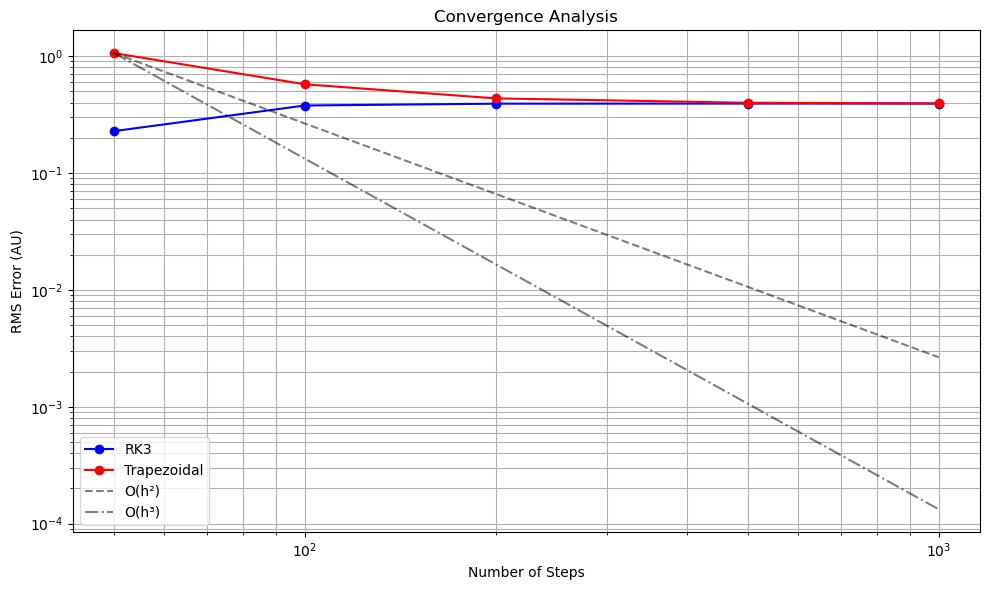


Convergence Analysis Results:
RK3 empirical rate: -0.14
Trapezoidal empirical rate: 0.30


In [15]:
# Analyze convergence by comparing different step sizes
step_counts = [50, 100, 200, 500, 1000]
convergence_results = {}

# Generate reference solution with high accuracy
print("Generating reference solution...")
orbit_ref = Orbits("reference")
orbit_ref.initialize_orbit(M, a, e, N)
t_ref = np.linspace(0, 2*T, 5000)  # Very high resolution for reference
y_ref = orbit_ref.run_simulation(
    slope_function=orbit_ref.relativistic_slope,
    integration_method="scipy",
    t_span=t_span,
    t_eval=t_ref,
    output_folder="output/example"
)

# Function to compute error
def compute_error(trajectory, ref_trajectory, ref_times, times):
    """Compute RMS error relative to reference solution"""
    from scipy.interpolate import interp1d
    
    # Interpolate reference solution to match time points
    x_interp = interp1d(ref_times, ref_trajectory[:, 0], bounds_error=False, fill_value="extrapolate")
    y_interp = interp1d(ref_times, ref_trajectory[:, 1], bounds_error=False, fill_value="extrapolate")
    
    x_ref = x_interp(times)
    y_ref = y_interp(times)
    
    # Compute position errors
    dx = trajectory[:, 0] - x_ref
    dy = trajectory[:, 1] - y_ref
    
    # Root mean square error
    error = np.sqrt(np.mean(dx**2 + dy**2))
    return error

# Test different step sizes with RK3 and trapezoidal methods
for method in ["rk3", "trapz"]:
    convergence_results[method] = {"steps": [], "errors": []}
    
    for steps in step_counts:
        print(f"Testing {method} with {steps} steps...")
        orbit = Orbits(f"convergence_{method}_{steps}")
        orbit.initialize_orbit(M, a, e, N)
        
        t_eval_conv = np.linspace(0, 2*T, steps)
        
        result = orbit.run_simulation(
            slope_function=orbit.relativistic_slope,
            integration_method=method,
            t_span=t_span,
            t_eval=t_eval_conv,
            output_folder="output/example"
        )
        
        # Compute error against reference
        error = compute_error(result, y_ref, t_ref, t_eval_conv)
        
        convergence_results[method]["steps"].append(steps)
        convergence_results[method]["errors"].append(error)
        
        print(f"  Error: {error:.8f} AU")

# Plot convergence results
plt.figure(figsize=(10, 6))
plt.loglog(convergence_results["rk3"]["steps"], convergence_results["rk3"]["errors"], 
           'bo-', label="RK3")
plt.loglog(convergence_results["trapz"]["steps"], convergence_results["trapz"]["errors"], 
           'ro-', label="Trapezoidal")

# Add theoretical convergence rates for reference
steps = np.array(step_counts)
max_error = max(max(convergence_results["rk3"]["errors"]), 
                max(convergence_results["trapz"]["errors"]))

# O(h^2) reference line
plt.loglog(steps, max_error * (steps[0]/steps)**2, 'k--', alpha=0.5, label="O(h²)")

# O(h^3) reference line
plt.loglog(steps, max_error * (steps[0]/steps)**3, 'k-.', alpha=0.5, label="O(h³)")

plt.xlabel("Number of Steps")
plt.ylabel("RMS Error (AU)")
plt.title("Convergence Analysis")
plt.grid(True, which="both", ls="-")
plt.legend()
plt.tight_layout()
plt.savefig("output/example/convergence_analysis.png", dpi=300)
plt.show()

# Compute empirical convergence rates
def estimate_convergence_rate(steps, errors):
    """Estimate numerical convergence rate"""
    log_steps = np.log(steps)
    log_errors = np.log(errors)
    slope, _, _, _, _ = np.polyfit(log_steps, log_errors, 1, full=True)
    return -slope

print("\nConvergence Analysis Results:")
rk3_rate = estimate_convergence_rate(convergence_results['rk3']['steps'], convergence_results['rk3']['errors'])
trapz_rate = estimate_convergence_rate(convergence_results['trapz']['steps'], convergence_results['trapz']['errors'])

print(f"RK3 empirical rate: {rk3_rate[0]:.2f}")
print(f"Trapezoidal empirical rate: {trapz_rate[0]:.2f}")

7. Summary

In [16]:
print("Summary of Orbits Module Examples:")
print("1. Basic orbit simulation comparing classical and relativistic models")
print("2. Comparison of different numerical integration methods")
print("3. Exploration of orbits with different eccentricities")
print("4. Creation of animated visualizations")
print("5. Simulation of extreme relativistic effects near a black hole")
print("6. Convergence analysis of numerical methods")
print("\nAll results are saved in the output/example directory.")

Summary of Orbits Module Examples:
1. Basic orbit simulation comparing classical and relativistic models
2. Comparison of different numerical integration methods
3. Exploration of orbits with different eccentricities
4. Creation of animated visualizations
5. Simulation of extreme relativistic effects near a black hole
6. Convergence analysis of numerical methods

All results are saved in the output/example directory.
